In [4]:
!pip install accelerate

In [3]:
!pip install kagglehub

In [2]:
!pip install clean-fid

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 113.8 MB/s eta 0:00:00
  Attempting uninstall: sympy
    Found existing installation: sympy 1.13.3
    Uninstalling sympy-1.13.3:
      Successfully uninstalled sympy-1.13.3


In [6]:
!pip install diffusers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 82.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 796.9/796.9 kB 70.9 MB/s eta 0:00:00


In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("badasstechie/celebahq-resized-256x256")

print("Path to dataset files:", path)

100%|██████████| 283M/283M [00:10<00:00, 29.3MB/s] 

Extracting files...


Path to dataset files: /home/infres/cchavez-23/.cache/kagglehub/datasets/badasstechie/celebahq-resized-256x256/versions/1


In [12]:
import os
import shutil

# Original dataset directory
original_dataset_dir = "/home/infres/cchavez-23/.cache/kagglehub/datasets/badasstechie/celebahq-resized-256x256/versions/1/celeba_hq_256"

# New directory for the subset of 100 images
subset_dir = "/home/infres/cchavez-23/.cache/kagglehub/datasets/badasstechie/celebahq-resized-256x256/versions/1_subset_100"

# Ensure the subset directory exists
os.makedirs(subset_dir, exist_ok=True)

# Get all image file names from the original dataset directory
image_files = [f for f in os.listdir(original_dataset_dir) if os.path.isfile(os.path.join(original_dataset_dir, f))]

# Select the first 100 images (you can randomize this selection if needed)
selected_images = image_files[:100]

# Copy the selected images to the new directory
for image_file in selected_images:
    src = os.path.join(original_dataset_dir, image_file)
    dst = os.path.join(subset_dir, image_file)
    shutil.copy(src, dst)

print(f"Copied 100 images to {subset_dir}")

Copied 100 images to /home/infres/cchavez-23/.cache/kagglehub/datasets/badasstechie/celebahq-resized-256x256/versions/1_subset_100


In [10]:
import os

# Path to the directory
directory_path = "/home/infres/cchavez-23/.cache/kagglehub/datasets/badasstechie/celebahq-resized-256x256/versions/1"

# List of image file extensions
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff']

# Get all files in the directory
files_in_directory = os.listdir(directory_path)

# Filter out image files
image_files = [file for file in files_in_directory if os.path.splitext(file)[1].lower() in image_extensions]

# Check if there are any image files
if image_files:
    print(f"Found {len(image_files)} image(s) in the directory.")
else:
    print("No images found in the directory.")


No images found in the directory.


### Imports

In [1]:
import torch
from diffusers import DiffusionPipeline, DDPMPipeline, DDIMScheduler, UNet2DModel, DPMSolverMultistepScheduler, DDPMScheduler
from torchvision import datasets, transforms
from torchvision.models import inception_v3
from scipy.linalg import sqrtm
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from diffusers import UNet2DModel
import PIL.Image
import tqdm

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d: Error no file named diffusion_pytorch_model.safetensors found in directory /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

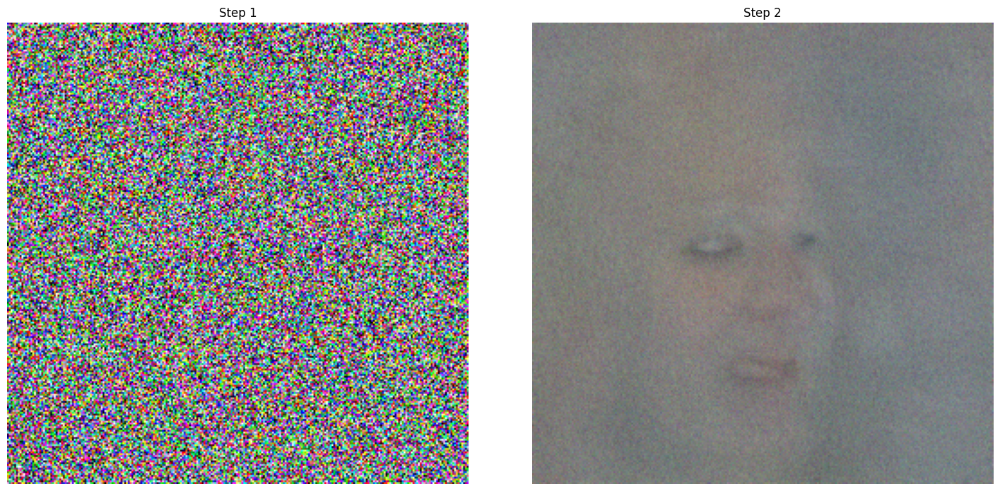

In [5]:
# Load the pre-trained model and scheduler
pipe = DDPMPipeline.from_pretrained("google/ddpm-celebahq-256")

# Generate 5 images at different steps
steps_to_plot = [1, 2]
generated_images = []

# Generate images at different inference steps
for step in steps_to_plot:
    generated_image = pipe(num_inference_steps=step).images[0]
    generated_images.append(generated_image)

# Plot the generated images
plt.figure(figsize=(15, 7))
for i, image in enumerate(generated_images):
    plt.subplot(1, len(generated_images), i + 1)
    plt.imshow(image)
    plt.title(f"Step {steps_to_plot[i]}")
    plt.axis('off')


plt.tight_layout()
plt.show()


In [ ]:
from PIL import Image

def check_image_validity(image_path):
    try:
        img = Image.open(image_path)
        img.verify()  # Verify that it's a valid image
        #print('ok')
        return True
        
    except (IOError, SyntaxError) as e:
        print(f"Invalid image {image_path}: {e}")
        return False

# Check images in both directories
for image_file in os.listdir(single_image_dir):
    check_image_validity(os.path.join(single_image_dir, image_file))

for image_file in os.listdir(subset_dir):
    check_image_validity(os.path.join(subset_dir, image_file))

what


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9: Error no file named diffusion_pytorch_model.safetensors found in directory /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 2 images in the folder generated_images_nfe_group_1


FID generated_images_nfe_group_1 : 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


compute FID of a folder with lsun_cat statistics
Found 2 images in the folder generated_images_nfe_group_2


FID generated_images_nfe_group_2 : 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


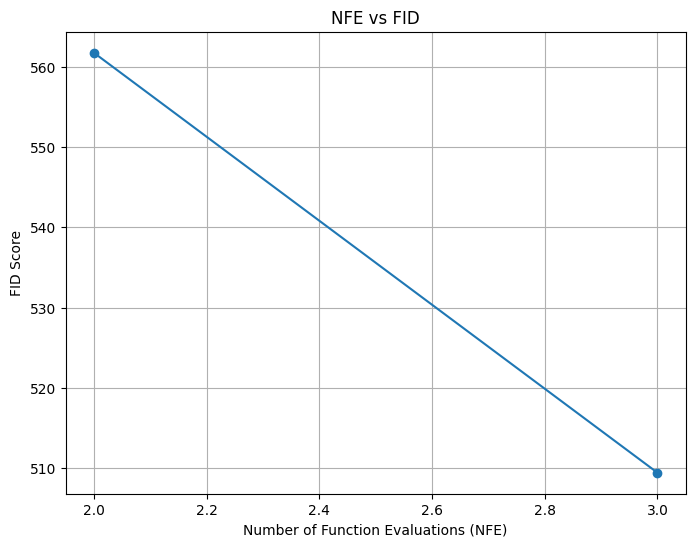

In [4]:
import os
from diffusers import DDPMPipeline
import matplotlib.pyplot as plt
from cleanfid import fid

# Load the pre-trained model
pipe = DDPMPipeline.from_pretrained("google/ddpm-cat-256")

# Define the steps for which images will be generated
steps_group_1 = [1, 2]
steps_group_2 = [10, 15]

# Create directories for the groups
group_1_dir = "generated_images_nfe_group_1"
group_2_dir = "generated_images_nfe_group_2"
os.makedirs(group_1_dir, exist_ok=True)
os.makedirs(group_2_dir, exist_ok=True)

# Generate and save images for group 1 (steps 1 and 2)
for step in steps_group_1:
    generated_image = pipe(num_inference_steps=step).images[0]
    image_path = os.path.join(group_1_dir, f"image_step_{step}.png")
    generated_image.save(image_path)

# Generate and save images for group 2 (steps 2 and 3)
for step in steps_group_2:
    generated_image = pipe(num_inference_steps=step).images[0]
    image_path = os.path.join(group_2_dir, f"image_step_{step}.png")
    generated_image.save(image_path)

# Compute FID scores for each group against the LSUN Cat dataset
fid_score_group_1 = fid.compute_fid(group_1_dir, dataset_name="lsun_cat", dataset_res=256, dataset_split="train", device="cpu")
fid_score_group_2 = fid.compute_fid(group_2_dir, dataset_name="lsun_cat", dataset_res=256, dataset_split="train", device="cpu")

# Plot NFE vs FID
plt.figure(figsize=(8, 6))
plt.plot([2, 3], [fid_score_group_1, fid_score_group_2], marker='o')
plt.xlabel("Number of Function Evaluations (NFE)")
plt.ylabel("FID Score")
plt.title("NFE vs FID")
plt.grid(True)
plt.show()


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 2 images in the folder generated_images_dpm_group_1


FID generated_images_dpm_group_1 : 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


compute FID of a folder with lsun_cat statistics
Found 2 images in the folder generated_images_dpm_group_2


FID generated_images_dpm_group_2 : 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


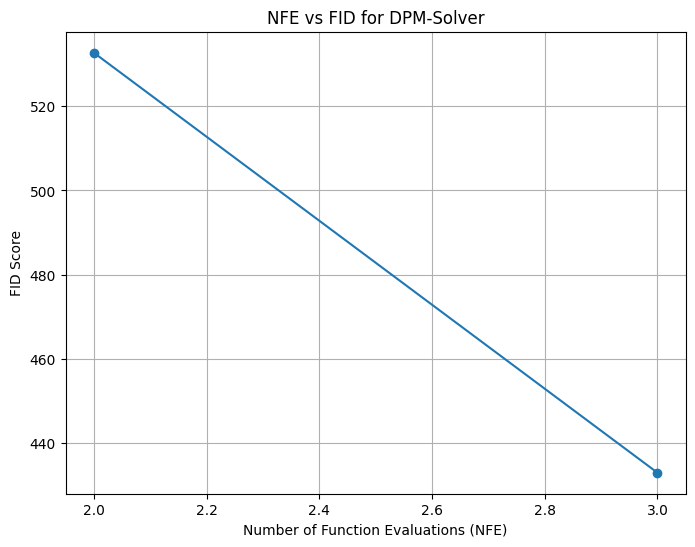

In [5]:
import os
from diffusers import DPMSolverMultistepScheduler
import matplotlib.pyplot as plt
from cleanfid import fid

# Load the pre-trained DPM-Solver model
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

# Define the steps for which images will be generated
steps_group_1 = [1, 2]
steps_group_2 = [10, 15]

# Create directories for the groups
group_1_dir = "generated_images_dpm_group_1"
group_2_dir = "generated_images_dpm_group_2"
os.makedirs(group_1_dir, exist_ok=True)
os.makedirs(group_2_dir, exist_ok=True)

# Generate and save images for group 1 (steps 1 and 2)
for step in steps_group_1:
    generated_image = pipe(num_inference_steps=step).images[0]
    image_path = os.path.join(group_1_dir, f"image_step_{step}.png")
    generated_image.save(image_path)

# Generate and save images for group 2 (steps 2 and 3)
for step in steps_group_2:
    generated_image = pipe(num_inference_steps=step).images[0]
    image_path = os.path.join(group_2_dir, f"image_step_{step}.png")
    generated_image.save(image_path)

# Compute FID scores for each group against the LSUN Cat dataset
fid_score_group_1 = fid.compute_fid(group_1_dir, dataset_name="lsun_cat", dataset_res=256, dataset_split="train", device="cpu")
fid_score_group_2 = fid.compute_fid(group_2_dir, dataset_name="lsun_cat", dataset_res=256, dataset_split="train", device="cpu")

# Plot NFE vs FID
plt.figure(figsize=(8, 6))
plt.plot([2, 3], [fid_score_group_1, fid_score_group_2], marker='o')
plt.xlabel("Number of Function Evaluations (NFE)")
plt.ylabel("FID Score")
plt.title("NFE vs FID for DPM-Solver")
plt.grid(True)
plt.show()


In [19]:
images_per_folder = 20
base_dir = "generated_images_comparison"

# Function to generate and save two images per folder
def generate_and_save_images(pipe, model_name, steps, dataset_name, res):
    scores = []
    for step in steps:
        step_dir = os.path.join(base_dir, f"NFE_{step}_{model_name}_{dataset_name}")
        os.makedirs(step_dir, exist_ok=True)
        
        # Generate and save images_per_folder images for each step
        for i in range(images_per_folder):
            generated_image = pipe(num_inference_steps=step).images[0]
            image_path = os.path.join(step_dir, f"image_{i}_step_{step}.png")
            generated_image.save(image_path)
        
        # Compute FID score
        fid_score = fid.compute_fid(step_dir, dataset_name=dataset_name, dataset_res=res, dataset_split="train", device="cpu")
        scores.append(fid_score)
    return scores

### Cat 256 comparison

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9: Error no file named diffusion_pytorch_model.safetensors found in directory /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9: Error no file named diffusion_pytorch_model.safetensors found in directory /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
/home/infres/cchavez-23/mambaforge/lib/python3.12/site-packages/diffusers/schedulers/scheduling_dpmsolver_multistep.py:238: FutureWarning: `algorithm_types dpmsolver and sde-dpmsolver` is deprecated and will be removed in version 1.0.0. algorithm_type dpmsolver is deprecated and will be removed in a future version. Choose from `dpmsolver++` or `sde-dpmsolver++` instead
  deprecate("algorithm_types dpmsolver and sde-dpmsolver", "1.0.0", deprecation_message)


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9: Error no file named diffusion_pytorch_model.safetensors found in directory /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_1_DDPM_lsun_cat


FID NFE_1_DDPM_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_2_DDPM_lsun_cat


FID NFE_2_DDPM_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_3_DDPM_lsun_cat


FID NFE_3_DDPM_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_4_DDPM_lsun_cat


FID NFE_4_DDPM_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_5_DDPM_lsun_cat


FID NFE_5_DDPM_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_10_DDPM_lsun_cat


FID NFE_10_DDPM_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_15_DDPM_lsun_cat


FID NFE_15_DDPM_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_30_DDPM_lsun_cat


FID NFE_30_DDPM_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_1_DPM_solver_lsun_cat


FID NFE_1_DPM_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_2_DPM_solver_lsun_cat


FID NFE_2_DPM_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_3_DPM_solver_lsun_cat


FID NFE_3_DPM_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_4_DPM_solver_lsun_cat


FID NFE_4_DPM_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_5_DPM_solver_lsun_cat


FID NFE_5_DPM_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_10_DPM_solver_lsun_cat


FID NFE_10_DPM_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_15_DPM_solver_lsun_cat


FID NFE_15_DPM_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_30_DPM_solver_lsun_cat


FID NFE_30_DPM_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_1_DDIMP_solver_lsun_cat


FID NFE_1_DDIMP_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_2_DDIMP_solver_lsun_cat


FID NFE_2_DDIMP_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_3_DDIMP_solver_lsun_cat


FID NFE_3_DDIMP_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_4_DDIMP_solver_lsun_cat


FID NFE_4_DDIMP_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_5_DDIMP_solver_lsun_cat


FID NFE_5_DDIMP_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_10_DDIMP_solver_lsun_cat


FID NFE_10_DDIMP_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_15_DDIMP_solver_lsun_cat


FID NFE_15_DDIMP_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

compute FID of a folder with lsun_cat statistics
Found 10 images in the folder generated_images_comparison/NFE_30_DDIMP_solver_lsun_cat


FID NFE_30_DDIMP_solver_lsun_cat : 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


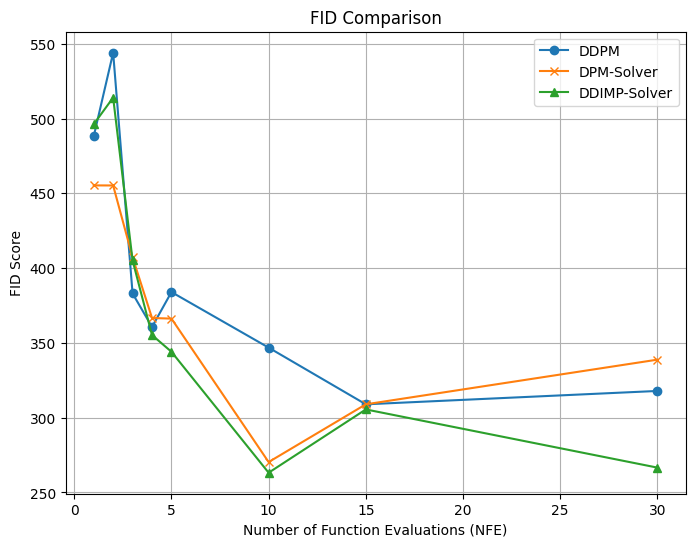

In [18]:
import os
from diffusers import DDPMPipeline, DPMSolverMultistepScheduler, DPMSolverSinglestepScheduler, DDIMPipeline
import matplotlib.pyplot as plt
from cleanfid import fid
from PIL import Image

# Load the pre-trained models
ddpm_pipe = DDPMPipeline.from_pretrained("google/ddpm-cat-256")
#ddpm_pipe = ddpm_pipe.to("cuda")
dpm_solver_pipe = DDPMPipeline.from_pretrained("google/ddpm-cat-256")
dpm_solver_pipe.scheduler = DPMSolverMultistepScheduler.from_config(dpm_solver_pipe.scheduler.config, solver_order=3, algorithm_type="dpmsolver", final_sigmas_type="sigma_min")
#dpm_solver_pipe.scheduler = DPMSolverSinglestepScheduler.from_config(dpm_solver_pipe.scheduler.config, solver_order=3)
#dpm_solver_pipe = dpm_solver_pipe.to("cuda")
ddimp_solver_pipe = DDIMPipeline.from_pretrained("google/ddpm-cat-256")

# Define the steps to be used for both models
steps_to_evaluate = [1, 2, 3, 4 ,5, 10, 15, 30]

# Directories for storing generated images
os.makedirs(base_dir, exist_ok=True)


# Generate and save images for DDPM
fid_scores_ddpm = generate_and_save_images(ddpm_pipe, "DDPM", steps_to_evaluate, "lsun_cat", 256)

# Generate and save images for DPM-Solver
fid_scores_dpm_solver = generate_and_save_images(dpm_solver_pipe, "DPM_solver", steps_to_evaluate, "lsun_cat", 256)

# Generate and save images for DPM-Solver
fid_scores_ddimp_solver = generate_and_save_images(ddimp_solver_pipe, "DDIMP_solver", steps_to_evaluate, "lsun_cat", 256)

# Plot FID comparison
plt.figure(figsize=(8, 6))
plt.plot(steps_to_evaluate, fid_scores_ddpm, marker='o', label='DDPM')
plt.plot(steps_to_evaluate, fid_scores_dpm_solver, marker='x', label='DPM-Solver')
plt.plot(steps_to_evaluate, fid_scores_ddimp_solver, marker='^', label='DDIMP-Solver')
plt.xlabel("Number of Function Evaluations (NFE)")
plt.ylabel("FID Score")
plt.title("FID Comparison")
plt.legend()
plt.grid(True)
plt.show()


### Cifar10 32 comparison

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cifar10-32/snapshots/267b167dc01f0e4e61923ea244e8b988f84deb80: Error no file named diffusion_pytorch_model.safetensors found in directory /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cifar10-32/snapshots/267b167dc01f0e4e61923ea244e8b988f84deb80.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cifar10-32/snapshots/267b167dc01f0e4e61923ea244e8b988f84deb80: Error no file named diffusion_pytorch_model.safetensors found in directory /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cifar10-32/snapshots/267b167dc01f0e4e61923ea244e8b988f84deb80.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cifar10-32/snapshots/267b167dc01f0e4e61923ea244e8b988f84deb80: Error no file named diffusion_pytorch_model.safetensors found in directory /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cifar10-32/snapshots/267b167dc01f0e4e61923ea244e8b988f84deb80.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_1_DDPM_cifar10


FID NFE_1_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_2_DDPM_cifar10


FID NFE_2_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_3_DDPM_cifar10


FID NFE_3_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_4_DDPM_cifar10


FID NFE_4_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_5_DDPM_cifar10


FID NFE_5_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_7_DDPM_cifar10


FID NFE_7_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_10_DDPM_cifar10


FID NFE_10_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_12_DDPM_cifar10


FID NFE_12_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_15_DDPM_cifar10


FID NFE_15_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_18_DDPM_cifar10


FID NFE_18_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_20_DDPM_cifar10


FID NFE_20_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_30_DDPM_cifar10


FID NFE_30_DDPM_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_1_DPM_solver_cifar10


FID NFE_1_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_2_DPM_solver_cifar10


FID NFE_2_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_3_DPM_solver_cifar10


FID NFE_3_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_4_DPM_solver_cifar10


FID NFE_4_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_5_DPM_solver_cifar10


FID NFE_5_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_7_DPM_solver_cifar10


FID NFE_7_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_10_DPM_solver_cifar10


FID NFE_10_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_12_DPM_solver_cifar10


FID NFE_12_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_15_DPM_solver_cifar10


FID NFE_15_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_18_DPM_solver_cifar10


FID NFE_18_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_20_DPM_solver_cifar10


FID NFE_20_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_30_DPM_solver_cifar10


FID NFE_30_DPM_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_1_DDIMP_solver_cifar10


FID NFE_1_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_2_DDIMP_solver_cifar10


FID NFE_2_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_3_DDIMP_solver_cifar10


FID NFE_3_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_4_DDIMP_solver_cifar10


FID NFE_4_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_5_DDIMP_solver_cifar10


FID NFE_5_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.02s/it]


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_7_DDIMP_solver_cifar10


FID NFE_7_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_10_DDIMP_solver_cifar10


FID NFE_10_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_12_DDIMP_solver_cifar10


FID NFE_12_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_15_DDIMP_solver_cifar10


FID NFE_15_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_18_DDIMP_solver_cifar10


FID NFE_18_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_20_DDIMP_solver_cifar10


FID NFE_20_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

compute FID of a folder with cifar10 statistics
Found 20 images in the folder generated_images_comparison/NFE_30_DDIMP_solver_cifar10


FID NFE_30_DDIMP_solver_cifar10 : 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


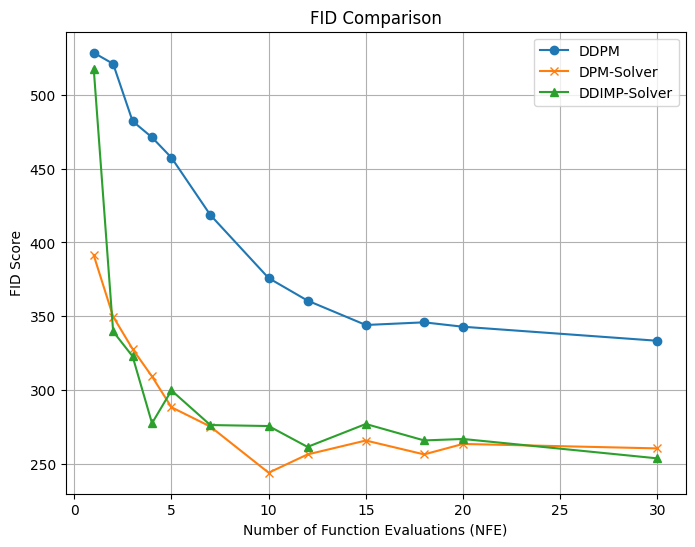

In [ ]:
import os
from diffusers import DDPMPipeline, DPMSolverMultistepScheduler, DPMSolverSinglestepScheduler, DDIMPipeline
import matplotlib.pyplot as plt
from cleanfid import fid
from PIL import Image

# Load the pre-trained models
ddpm_pipe = DDPMPipeline.from_pretrained("google/ddpm-cifar10-32")
#ddpm_pipe = ddpm_pipe.to("cuda")
dpm_solver_pipe = DDPMPipeline.from_pretrained("google/ddpm-cifar10-32")
dpm_solver_pipe.scheduler = DPMSolverMultistepScheduler.from_config(dpm_solver_pipe.scheduler.config, solver_order=3, algorithm_type="dpmsolver", final_sigmas_type="sigma_min")
#dpm_solver_pipe.scheduler = DPMSolverMultistepScheduler.from_config(dpm_solver_pipe.scheduler.config)
#dpm_solver_pipe.scheduler = DPMSolverSinglestepScheduler.from_config(dpm_solver_pipe.scheduler.config, solver_order=3)
#dpm_solver_pipe = dpm_solver_pipe.to("cuda")
ddimp_solver_pipe = DDIMPipeline.from_pretrained("google/ddpm-cifar10-32")

# Define the steps to be used for both models
steps_to_evaluate = [1, 2, 3, 4 ,5, 7, 10, 12, 15, 18, 20, 30]

# Directories for storing generated images
os.makedirs(base_dir, exist_ok=True)


# Generate and save images for DDPM
fid_scores_ddpm = generate_and_save_images(ddpm_pipe, "DDPM", steps_to_evaluate, "cifar10", 32)

# Generate and save images for DPM-Solver
fid_scores_dpm_solver = generate_and_save_images(dpm_solver_pipe, "DPM_solver", steps_to_evaluate, "cifar10", 32)

# Generate and save images for DPM-Solver
fid_scores_ddimp_solver = generate_and_save_images(ddimp_solver_pipe, "DDIMP_solver", steps_to_evaluate, "cifar10", 32)

# Plot FID comparison
plt.figure(figsize=(8, 6))
plt.plot(steps_to_evaluate, fid_scores_ddpm, marker='o', label='DDPM')
plt.plot(steps_to_evaluate, fid_scores_dpm_solver, marker='x', label='DPM-Solver')
plt.plot(steps_to_evaluate, fid_scores_ddimp_solver, marker='^', label='DDIMP-Solver')
plt.xlabel("Number of Function Evaluations (NFE)")
plt.ylabel("FID Score")
plt.title("FID Comparison")
plt.legend()
plt.grid(True)
plt.show()


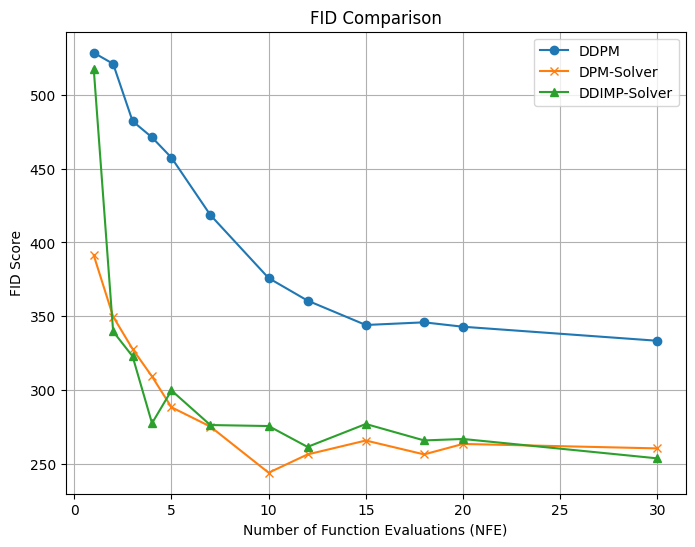

In [21]:
# Plot FID comparison
plt.figure(figsize=(8, 6))
plt.plot(steps_to_evaluate, fid_scores_ddpm, marker='o', label='DDPM')
plt.plot(steps_to_evaluate, fid_scores_dpm_solver, marker='x', label='DPM-Solver')
plt.plot(steps_to_evaluate, fid_scores_ddimp_solver, marker='^', label='DDIMP-Solver')
plt.xlabel("Number of Function Evaluations (NFE)")
plt.ylabel("FID Score")
plt.title("FID Comparison")
plt.legend()
plt.grid(True)
plt.show()


### Trying to generate the same samples with DDIM

An error occurred while trying to fetch google/ddpm-church-256: google/ddpm-church-256 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
 18%|█▊        | 9/50 [00:06<00:31,  1.31it/s]

'Image at step 10'

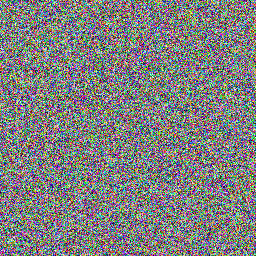

 38%|███▊      | 19/50 [00:14<00:25,  1.23it/s]

'Image at step 20'

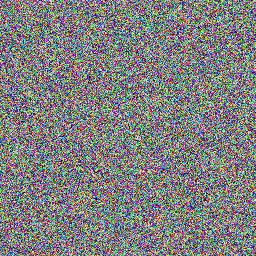

 58%|█████▊    | 29/50 [00:21<00:14,  1.42it/s]

'Image at step 30'

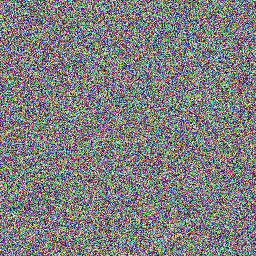

 78%|███████▊  | 39/50 [00:28<00:07,  1.41it/s]

'Image at step 40'

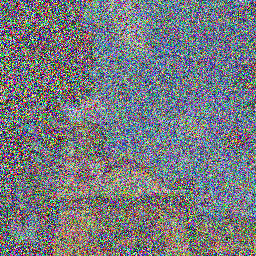

 98%|█████████▊| 49/50 [00:35<00:00,  1.42it/s]

'Image at step 50'

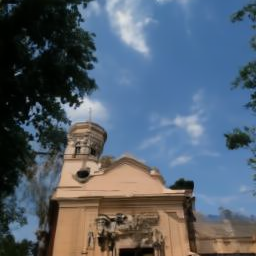

100%|██████████| 50/50 [00:36<00:00,  1.37it/s]


In [ ]:
def display_sample(sample, i):
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)

    image_pil = PIL.Image.fromarray(image_processed[0])
    display(f"Image at step {i}")
    display(image_pil)

torch.manual_seed(0)

repo_id = "google/ddpm-church-256"
model = UNet2DModel.from_pretrained(repo_id)

noisy_sample = torch.randn(
    1, model.config.in_channels, model.config.sample_size, model.config.sample_size
)

#scheduler = DDIMScheduler.from_config(repo_id)
scheduler = DDPMScheduler.from_config(repo_id)

scheduler.set_timesteps(num_inference_steps=50)

sample = noisy_sample

for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
  # 1. predict noise residual
  with torch.no_grad():
      residual = model(sample, t).sample

  # 2. compute previous image and set x_t -> x_t-1
  sample = scheduler.step(residual, t, sample).prev_sample

  # 3. optionally look at image
  if (i + 1) % 10 == 0:
      display_sample(sample, i + 1)

### Trying to generate the same samples with DPM-Solver

An error occurred while trying to fetch google/ddpm-church-256: google/ddpm-church-256 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
/home/infres/cchavez-23/mambaforge/lib/python3.12/site-packages/diffusers/configuration_utils.py:245: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a scheduler, please use <class 'diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler'>.from_pretrained(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)
 18%|█▊        | 9/50 [00:05<00:26,  1.54it/s]

'Image at step 10'

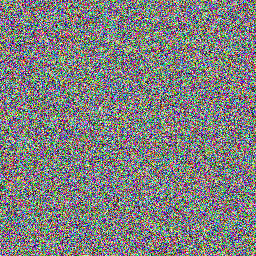

 38%|███▊      | 19/50 [00:12<00:19,  1.57it/s]

'Image at step 20'

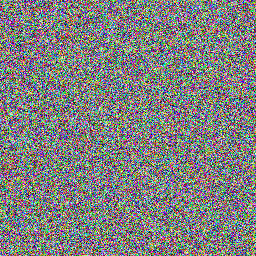

 58%|█████▊    | 29/50 [00:18<00:13,  1.57it/s]

'Image at step 30'

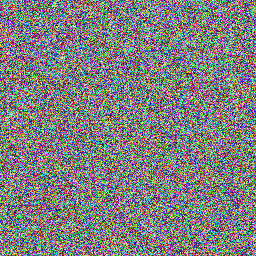

 78%|███████▊  | 39/50 [00:25<00:07,  1.56it/s]

'Image at step 40'

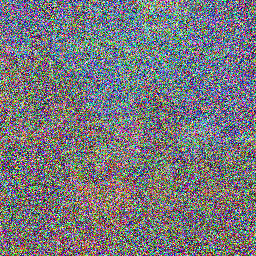

 98%|█████████▊| 49/50 [00:31<00:00,  1.37it/s]

'Image at step 50'

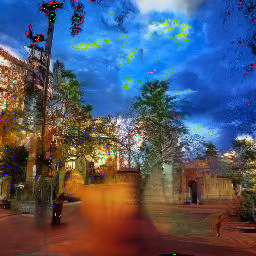

100%|██████████| 50/50 [00:32<00:00,  1.54it/s]


In [9]:
import torch
import tqdm
from diffusers import UNet2DModel, DPMSolverMultistepScheduler
import PIL.Image
import numpy as np

def display_sample(sample, i):
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)

    image_pil = PIL.Image.fromarray(image_processed[0])
    display(f"Image at step {i}")
    display(image_pil)

# Set seed for reproducibility
torch.manual_seed(0)

# Load the pre-trained model
repo_id = "google/ddpm-church-256"
model = UNet2DModel.from_pretrained(repo_id)

# Initialize a random noise sample
noisy_sample = torch.randn(
    1, model.config.in_channels, model.config.sample_size, model.config.sample_size
)

# Initialize the DPMSolverMultistepScheduler
scheduler = DPMSolverMultistepScheduler.from_config(repo_id)
scheduler.set_timesteps(num_inference_steps=50)

# Set initial sample
sample = noisy_sample

# Perform the denoising steps
for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
    # Predict noise residual
    with torch.no_grad():
        residual = model(sample, t).sample

    # Compute the previous image and set x_t -> x_t-1
    sample = scheduler.step(residual, t, sample).prev_sample

    # Optionally display the image every 10 steps
    if (i + 1) % 10 == 0:
        display_sample(sample, i + 1)


### Generating same samples with the 3 models

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

100%|██████████| 20/20 [00:04<00:00,  4.26it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.729646..2.9721599].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7300804..2.9724844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7300804..2.9724844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6598518..2.6931612].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.734668..2.9710617].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7360737..2.9723437].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats o

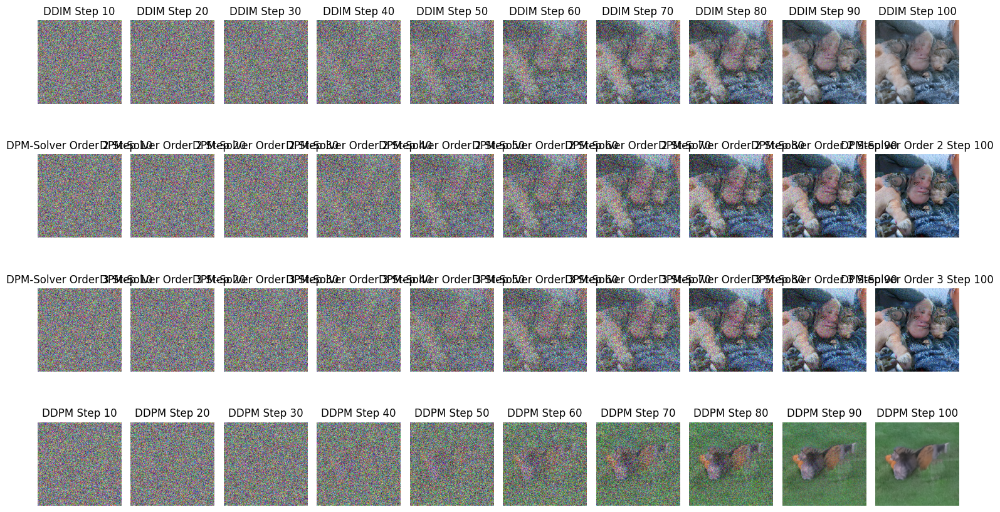

In [10]:
def generate_images_with_scheduler(model, scheduler, num_steps, initial_noise):
    scheduler.set_timesteps(num_inference_steps=num_steps)
    sample = initial_noise.clone()
    images = []

    for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
        with torch.no_grad():
            residual = model(sample, t).sample
        sample = scheduler.step(residual, t, sample).prev_sample
        
        if (i + 1) % 2 == 0:
            images.append(sample.cpu().permute(0, 2, 3, 1).squeeze().numpy())
    
    return images

# Set seed for reproducibility
torch.manual_seed(1)

# Load pre-trained model
repo_id = "google/ddpm-cat-256"

pipe = DDPMPipeline.from_pretrained(repo_id)

# Initialize schedulers with solver orders 2 and 3
ddim_scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
dpm_solver_scheduler_2 = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config, algorithm_type="dpmsolver", final_sigmas_type="sigma_min", solver_order=2)
dpm_solver_scheduler_3 = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config, algorithm_type="dpmsolver", final_sigmas_type="sigma_min", solver_order=3)
ddpm_scheduler = DDPMScheduler.from_config(pipe.scheduler.config)

# Number of steps for evaluation
num_steps = 20

model = UNet2DModel.from_pretrained(repo_id)
# Generate initial noise
initial_noise = torch.randn(1, model.config.in_channels, model.config.sample_size, model.config.sample_size)

# Generate images for each scheduler
ddim_images = generate_images_with_scheduler(model, ddim_scheduler, num_steps, initial_noise)
dpm_solver_images_2 = generate_images_with_scheduler(model, dpm_solver_scheduler_2, num_steps, initial_noise)
dpm_solver_images_3 = generate_images_with_scheduler(model, dpm_solver_scheduler_3, num_steps, initial_noise)
ddpm_images = generate_images_with_scheduler(model, ddpm_scheduler, num_steps, initial_noise)

# Plotting images side by side for comparison
fig, axs = plt.subplots(4, len(ddim_images), figsize=(15, 9))
for i, (ddim_img, dpm_solver_img_2, dpm_solver_img_3, ddpm_img) in enumerate(zip(ddim_images, dpm_solver_images_2, dpm_solver_images_3, ddpm_images)):
    axs[0, i].imshow((ddim_img + 1.0) * 127.5 / 255)
    axs[0, i].axis('off')
    axs[0, i].set_title(f"DDIM Step {10 * (i + 1)}")

    axs[1, i].imshow((dpm_solver_img_2 + 1.0) * 127.5 / 255)
    axs[1, i].axis('off')
    axs[1, i].set_title(f"DPM-Solver Order 2 Step {10 * (i + 1)}")

    axs[2, i].imshow((dpm_solver_img_3 + 1.0) * 127.5 / 255)
    axs[2, i].axis('off')
    axs[2, i].set_title(f"DPM-Solver Order 3 Step {10 * (i + 1)}")

    axs[3, i].imshow((ddpm_img + 1.0) * 127.5 / 255)
    axs[3, i].axis('off')
    axs[3, i].set_title(f"DDPM Step {10 * (i + 1)}")

plt.tight_layout()
plt.show()

### Image as in the paper

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:23<00:00,  4.30it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008663595..1.0075605].


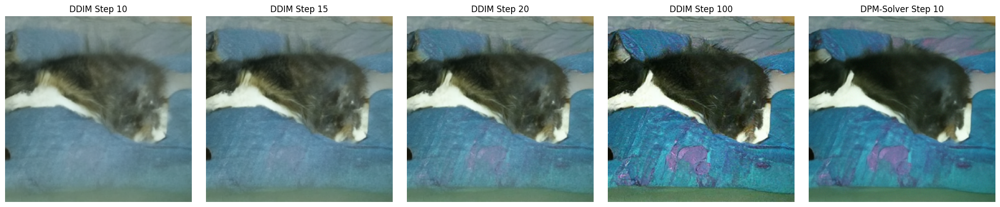

In [15]:
def generate_images_with_scheduler(model, scheduler, num_steps, initial_noise, steps_to_plot):
    scheduler.set_timesteps(num_inference_steps=num_steps)
    sample = initial_noise.clone()
    images = []

    for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
        with torch.no_grad():
            residual = model(sample, t).sample
        sample = scheduler.step(residual, t, sample).prev_sample
        
        if (i + 1) in steps_to_plot:  # Store images for specific iterations
            images.append((i + 1, sample.cpu().permute(0, 2, 3, 1).squeeze().numpy()))
    
    return images

# Set seed for reproducibility
torch.manual_seed(2)

# Load pre-trained model
repo_id = "google/ddpm-cat-256"

pipe = DDPMPipeline.from_pretrained(repo_id)

# Initialize schedulers
ddim_scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
dpm_solver_scheduler_3 = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config, algorithm_type="dpmsolver", final_sigmas_type="sigma_min", solver_order=3)

# Number of steps for evaluation
num_steps_10 = 10
num_steps_15 = 15
num_steps_20 = 20
num_steps_100 = 100

model = UNet2DModel.from_pretrained(repo_id)
# Generate initial noise
initial_noise = torch.randn(1, model.config.in_channels, model.config.sample_size, model.config.sample_size)

# Generate images for each scheduler
dpm_solver_images_3 = generate_images_with_scheduler(model, dpm_solver_scheduler_3, num_steps=num_steps_10, initial_noise=initial_noise, steps_to_plot=[num_steps_10])
ddim_images_10 = generate_images_with_scheduler(model, ddim_scheduler, num_steps=num_steps_10, initial_noise=initial_noise, steps_to_plot=[num_steps_10])
ddim_images_15 = generate_images_with_scheduler(model, ddim_scheduler, num_steps=num_steps_15, initial_noise=initial_noise, steps_to_plot=[num_steps_15])
ddim_images_20 = generate_images_with_scheduler(model, ddim_scheduler, num_steps=num_steps_20, initial_noise=initial_noise, steps_to_plot=[num_steps_20])
ddim_images_100 = generate_images_with_scheduler(model, ddim_scheduler, num_steps=num_steps_100, initial_noise=initial_noise, steps_to_plot=[num_steps_100])

# Extract the images for plotting
dpm_solver_img_10 = [img for idx, img in dpm_solver_images_3 if idx == num_steps_10][0]
ddim_img_10 = [img for idx, img in ddim_images_10 if idx == num_steps_10][0]
ddim_img_15 = [img for idx, img in ddim_images_15 if idx == num_steps_15][0]
ddim_img_20 = [img for idx, img in ddim_images_20 if idx == num_steps_20][0]
ddim_img_100 = [img for idx, img in ddim_images_100 if idx == num_steps_100][0]

# Plotting the results in the same axis
fig, ax = plt.subplots(1, 5, figsize=(20, 4))

# Plot each image
ax[0].imshow((ddim_img_10 + 1.0) * 127.5 / 255)
ax[0].axis('off')
ax[0].set_title(f"DDIM Step 10")

ax[1].imshow((ddim_img_15 + 1.0) * 127.5 / 255)
ax[1].axis('off')
ax[1].set_title(f"DDIM Step 15")

ax[2].imshow((ddim_img_20 + 1.0) * 127.5 / 255)
ax[2].axis('off')
ax[2].set_title(f"DDIM Step 20")

ax[3].imshow((ddim_img_100 + 1.0) * 127.5 / 255)
ax[3].axis('off')
ax[3].set_title(f"DDIM Step 100")

# Plot DPM-Solver (Order 3) Step 10 as the last image
ax[4].imshow((dpm_solver_img_10 + 1.0) * 127.5 / 255)
ax[4].axis('off')
ax[4].set_title(f"DPM-Solver Step 10")

plt.tight_layout()
plt.show()


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9: Error no file named diffusion_pytorch_model.safetensors found in directory /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

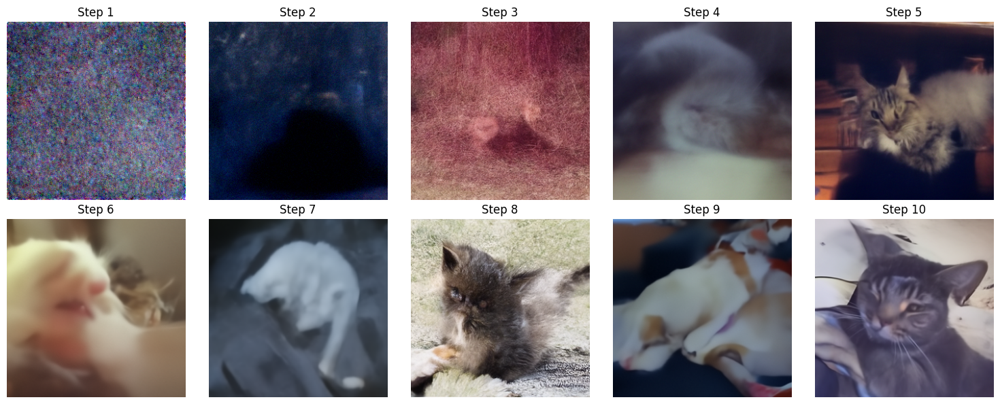

In [24]:
import os
from diffusers import DDPMPipeline
import matplotlib.pyplot as plt
from PIL import Image

# Create directory for generated images
os.makedirs("generated_images_ddpm", exist_ok=True)

# Initialize DDPM pipeline
ddpm_pipe = DDPMPipeline.from_pretrained("google/ddpm-cat-256")
ddpm_pipe.scheduler = DPMSolverMultistepScheduler.from_config(ddpm_pipe.scheduler.config)

# Define the steps for which images will be generated
steps_to_generate = list(range(1, 11))

# Generate and save images for each step
for step in steps_to_generate:
    generated_image = ddpm_pipe(num_inference_steps=step).images[0]
    image_path = os.path.join("generated_images_ddpm", f"DDPM_step_{step}.png")
    generated_image.save(image_path)

# Plot generated images
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, step in enumerate(steps_to_generate):
    image = Image.open(os.path.join("generated_images_ddpm", f"DDPM_step_{step}.png"))
    ax = axes[i // 5, i % 5]
    ax.imshow(image)
    ax.set_title(f"Step {step}")
    ax.axis('off')

plt.tight_layout()
plt.show()


In [26]:
import os
import torch
from diffusers import DDPMPipeline
import matplotlib.pyplot as plt
from PIL import Image

# Create directory for generated images
os.makedirs("generated_images_ddpm_continuous", exist_ok=True)

# Initialize DDPM pipeline
ddpm_pipe = DDPMPipeline.from_pretrained("google/ddpm-cat-256")
ddpm_pipe.to("cpu")  # Use "cuda" if a GPU is available

# Initialize the same initial noise for each iteration
initial_latent = torch.randn(1, ddpm_pipe.unet.in_channels, 256, 256)  # Latent shape should match the model's input

# Define the steps for which images will be generated
steps_to_generate = list(range(1, 11))

# Generate and save images sequentially
current_latent = initial_latent.clone()
for step in steps_to_generate:
    generated_image = ddpm_pipe.decode(current_latent).images[0]
    image_path = os.path.join("generated_images_ddpm_continuous", f"DDPM_step_{step}.png")
    generated_image.save(image_path)
    
    # Perform one step of denoising
    current_latent = ddpm_pipe.scheduler.step(current_latent, t=step).prev_sample

# Plot generated images
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, step in enumerate(steps_to_generate):
    image = Image.open(os.path.join("generated_images_ddpm_continuous", f"DDPM_step_{step}.png"))
    ax = axes[i // 5, i % 5]
    ax.imshow(image)
    ax.set_title(f"Step {step}")
    ax.axis('off')

plt.tight_layout()
plt.show()


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9: Error no file named diffusion_pytorch_model.safetensors found in directory /home/infres/cchavez-23/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
/tmp/ipykernel_961384/288920594.py:15: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DModel's config object instead, e.g. 'unet.config.in_channels'.
  initial_latent = torch.randn(1, ddpm_pipe.unet.in_channels, 256, 256)  # Latent shape should match the model's input


AttributeError: 'DDPMPipeline' object has no attribute 'decode'

config.json:   0%|          | 0.00/790 [00:00<?, ?B/s]

An error occurred while trying to fetch google/ddpm-church-256: google/ddpm-church-256 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


diffusion_pytorch_model.bin:   0%|          | 0.00/455M [00:00<?, ?B/s]

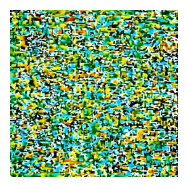

In [ ]:

repo_id = "google/ddpm-church-256"
model = UNet2DModel.from_pretrained(repo_id)
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)  # Ensure model is on the same device

def linear_beta_schedule(timesteps, start=1e-4, end=2e-2):
    return np.linspace(start, end, timesteps)

timesteps = 30
betas = linear_beta_schedule(timesteps)
alphas = 1.0 - betas
alphas_cumprod = np.cumprod(alphas)
alphas_cumprod_prev = np.append(1.0, alphas_cumprod[:-1])

def ddim_sample(model, alphas_cumprod, alphas_cumprod_prev, timesteps, shape, eta=0.0):
    images = torch.randn(shape, device=device)  # Start with random noise
    # Convert alphas to torch.Tensor
    alphas_cumprod = torch.tensor(alphas_cumprod, device=device, dtype=torch.float32)
    alphas_cumprod_prev = torch.tensor(alphas_cumprod_prev, device=device, dtype=torch.float32)
    
    for t in reversed(range(timesteps)):
        t_tensor = torch.tensor([t], device=device)
        noise_pred = model(images, t_tensor)["sample"]  # Predict noise
        
        alpha_t = alphas_cumprod[t]
        alpha_t_prev = alphas_cumprod_prev[t]
        beta_t = 1 - alpha_t
        
        # Calculate mean and variance for sampling
        mean = (
            images - beta_t * noise_pred / torch.sqrt(1 - alpha_t)
        ) / torch.sqrt(alpha_t)
        variance = eta * torch.sqrt(beta_t)
        
        if t > 0:
            images = mean + variance * torch.randn_like(images)
        else:
            images = mean
    return images
batch_size = 1
img_shape = (batch_size, 3, 256, 256)  # CIFAR-10 image dimensions

generated_images = ddim_sample(model, alphas_cumprod, alphas_cumprod_prev, timesteps, img_shape)
import matplotlib.pyplot as plt
images = (generated_images.clamp(-1, 1) + 1) / 2.0  # Normalize to [0, 1]
images = images.permute(0, 2, 3, 1).detach().numpy()  # Convert to HWC

plt.figure(figsize=(10, 10))
for i in range(batch_size):
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    plt.axis("off")
plt.show()

IndexError: index 1 is out of bounds for axis 0 with size 1

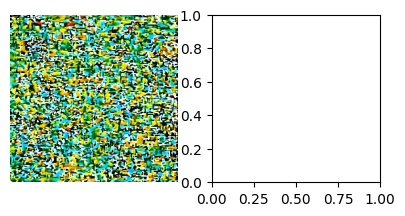

In [ ]:
plt.figure(figsize=(10, 10))
for i in range(30):
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    plt.axis("off")
plt.show()